<a href="https://colab.research.google.com/github/ArthurMor4is/t-xai/blob/main/agora_vai.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Treinando modelo - Fine tunning a partir de modelos confiáveis: Google, microsoft, ...

---------

# Explicando

In [ ]:
!pip install -q datasets transformers accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.1/519.1 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 26.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.2/244.2 kB 30.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 22.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 17.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 27.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 71.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 67.0 MB/s eta 0:00:00


In [ ]:
%%capture
!sudo apt -qq install git-lfs
!git config --global credential.helper store

In [ ]:
import torch
from PIL import Image
import requests

In [ ]:
from transformers import AutoModelForImageClassification, AutoImageProcessor
import torch

repo_name = "ArthurMor4is/vit-base-patch16-224-finetuned-dataset-covid-0"

image_processor = AutoImageProcessor.from_pretrained(repo_name)
model = AutoModelForImageClassification.from_pretrained(repo_name)

In [ ]:
def perform_inference(image: Image, model: torch.nn.Module, processor):
    """Performs inference given an image, a model, and its processor."""
    inputs = processor(image.convert("RGB"), return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs, output_attentions=True)

    # model predicts one of the 1000 ImageNet classes
    # predicted_label = outputs.logits.argmax(-1).item()
    # print(model.config.id2label[predicted_label])
    return outputs

## Mean attention distance

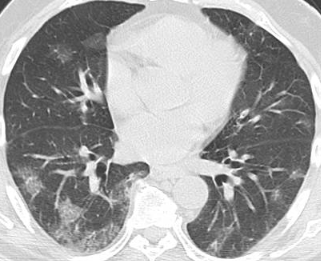

In [ ]:
from PIL import Image
import requests

image = Image.open('/content/q.png')
image

In [ ]:
image.mode

'RGBA'

In [ ]:
image.convert("RGB").size

(321, 261)

In [ ]:
from PIL import Image


def perform_inference(image: Image, model: torch.nn.Module, processor):
    """Performs inference given an image, a model, and its processor."""
    inputs = processor(image.convert("RGB"), return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs, output_attentions=True)

    # model predicts one of the 1000 ImageNet classes
    predicted_label = outputs.logits.argmax(-1).item()
    print(model.config.id2label[predicted_label])
    return outputs.attentions

In [ ]:
attention_scores = perform_inference(image, model, image_processor)

CT_COVID


In [ ]:
for i in range(len(attention_scores)):
    print(f"Transformer block {i}: {attention_scores[i].shape}")

Transformer block 0: torch.Size([1, 12, 197, 197])
Transformer block 1: torch.Size([1, 12, 197, 197])
Transformer block 2: torch.Size([1, 12, 197, 197])
Transformer block 3: torch.Size([1, 12, 197, 197])
Transformer block 4: torch.Size([1, 12, 197, 197])
Transformer block 5: torch.Size([1, 12, 197, 197])
Transformer block 6: torch.Size([1, 12, 197, 197])
Transformer block 7: torch.Size([1, 12, 197, 197])
Transformer block 8: torch.Size([1, 12, 197, 197])
Transformer block 9: torch.Size([1, 12, 197, 197])
Transformer block 10: torch.Size([1, 12, 197, 197])
Transformer block 11: torch.Size([1, 12, 197, 197])


In [ ]:
import numpy as np

# For vanilla ViT models, this should be 1. For DeiT models,
# this should be two.
num_cls_tokens = 1


def compute_distance_matrix(patch_size, num_patches, length):
    """Helper function to compute distance matrix."""
    distance_matrix = np.zeros((num_patches, num_patches))
    for i in range(num_patches):
        for j in range(num_patches):
            if i == j:  # zero distance
                continue

            xi, yi = (int(i / length)), (i % length)
            xj, yj = (int(j / length)), (j % length)
            distance_matrix[i, j] = patch_size * np.linalg.norm([xi - xj, yi - yj])

    return distance_matrix


def compute_mean_attention_dist(patch_size, attention_weights):
    # The attention_weights shape = (batch, num_heads, num_patches, num_patches)
    attention_weights = attention_weights[
        ..., num_cls_tokens:, num_cls_tokens:
    ]  # Removing the CLS token
    num_patches = attention_weights.shape[-1]
    length = int(np.sqrt(num_patches))
    assert length**2 == num_patches, "Num patches is not perfect square"

    distance_matrix = compute_distance_matrix(patch_size, num_patches, length)
    h, w = distance_matrix.shape

    distance_matrix = distance_matrix.reshape((1, 1, h, w))
    # The attention_weights along the last axis adds to 1
    # this is due to the fact that they are softmax of the raw logits
    # summation of the (attention_weights * distance_matrix)
    # should result in an average distance per token
    mean_distances = attention_weights * distance_matrix
    mean_distances = np.sum(
        mean_distances, axis=-1
    )  # sum along last axis to get average distance per token
    mean_distances = np.mean(
        mean_distances, axis=-1
    )  # now average across all the tokens

    return mean_distances

In [ ]:
def gather_mads(attention_scores, patch_size: int = 16):
    all_mean_distances = {
        f"block_{i}_mean_dist": compute_mean_attention_dist(
            patch_size=patch_size, attention_weights=attention_weight.numpy()
        )
        for i, attention_weight in enumerate(attention_scores)
    }
    return all_mean_distances

In [ ]:
patch_size = 16
all_mads = gather_mads(attention_scores, patch_size)

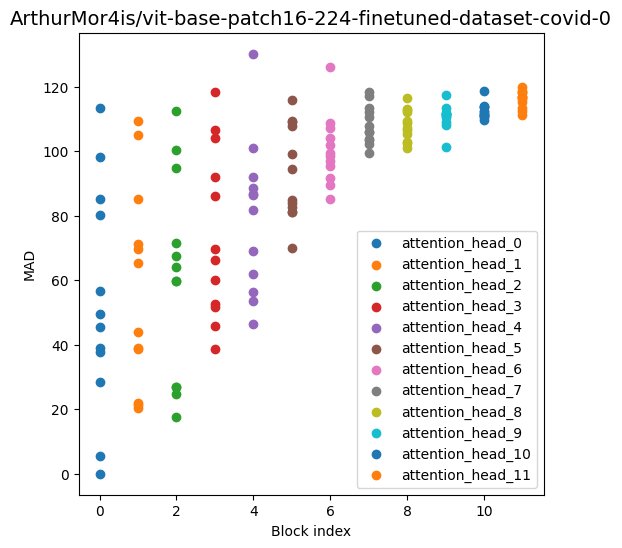

In [ ]:
import matplotlib.pyplot as plt


def visualize_mads(all_mads, ckpt_id):
    num_heads = len(all_mads)
    plt.figure(figsize=(6, 6))

    for idx in range(len(all_mads)):
        mean_distance = all_mads[f"block_{idx}_mean_dist"]
        x = [idx] * num_heads
        y = mean_distance[0, :]
        plt.scatter(x=x, y=y, label=f"attention_head_{idx}")

    plt.xlabel("Block index")
    plt.ylabel("MAD")
    plt.legend(loc="lower right")
    plt.title(ckpt_id, fontsize=14)
    plt.show()


visualize_mads(all_mads, repo_name)

## Attention Rollout

In [ ]:
import typing
import io
import os

import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

from urllib.request import urlretrieve

from PIL import Image
from torchvision import transforms

# from models.modeling import VisionTransformer, CONFIGS

In [ ]:
from PIL import Image


def perform_inference(image: Image, model: torch.nn.Module, processor):
    """Performs inference given an image, a model, and its processor."""
    inputs = processor(image.convert("RGB"), return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs, output_attentions=True)

    # model predicts one of the 1000 ImageNet classes
    # predicted_label = outputs.logits.argmax(-1).item()
    # print(model.config.id2label[predicted_label])
    return outputs

In [ ]:
im = Image.open("/content/q.png").convert("RGB")

In [ ]:
outputs = perform_inference(im, model, image_processor)

In [ ]:
inference = perform_inference(im, model, image_processor)

logits, att_mat = inference.logits, outputs.attentions

att_mat = torch.stack(att_mat).squeeze(1)

# Average the attention weights across all heads.
att_mat = torch.mean(att_mat, dim=1)

# To account for residual connections, we add an identity matrix to the
# attention matrix and re-normalize the weights.
residual_att = torch.eye(att_mat.size(1))
aug_att_mat = att_mat + residual_att
aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)

# Recursively multiply the weight matrices
joint_attentions = torch.zeros(aug_att_mat.size())
joint_attentions[0] = aug_att_mat[0]

for n in range(1, aug_att_mat.size(0)):
    joint_attentions[n] = torch.matmul(aug_att_mat[n], joint_attentions[n-1])

# Attention from the output token to the input space.
v = joint_attentions[-1]
grid_size = int(np.sqrt(aug_att_mat.size(-1)))
mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
mask = cv2.resize(mask / mask.max(), im.size)[..., np.newaxis]
result = (mask * im).astype("uint8")

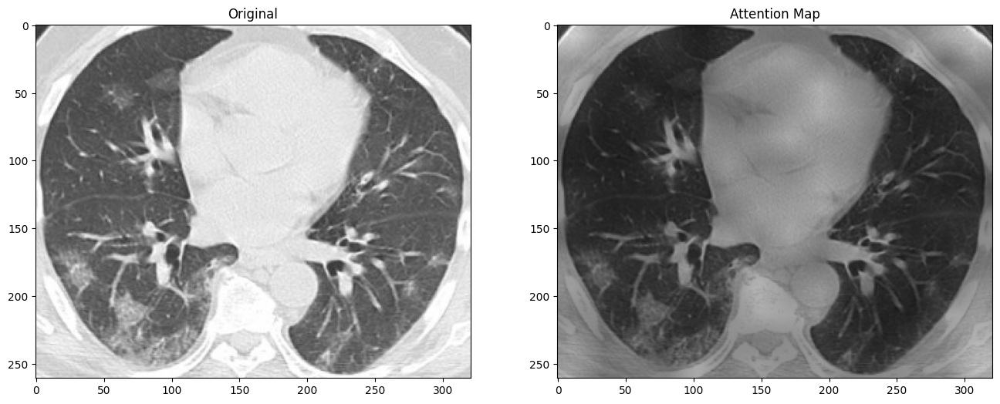

In [ ]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))

ax1.set_title('Original')
ax2.set_title('Attention Map')
_ = ax1.imshow(im)
_ = ax2.imshow(result)

probs = torch.nn.Softmax(dim=-1)(logits)
top5 = torch.argsort(probs, dim=-1, descending=True)

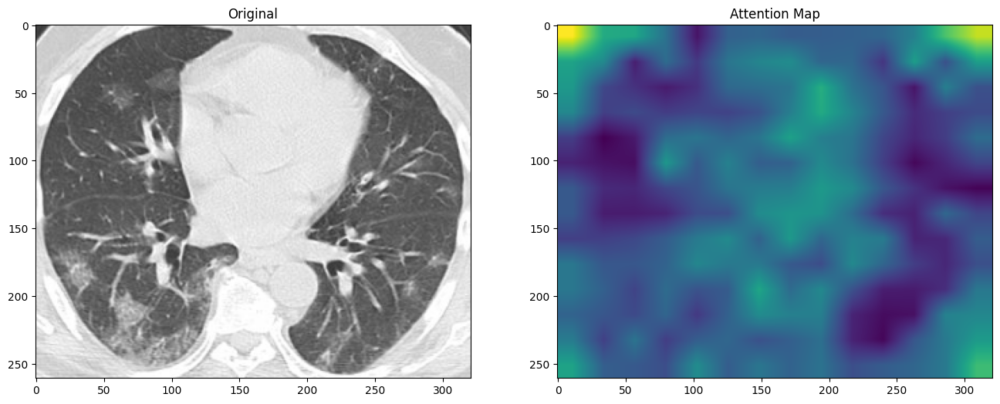

In [ ]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))

ax1.set_title('Original')
ax2.set_title('Attention Map')
_ = ax1.imshow(im)
_ = ax2.imshow(mask)

probs = torch.nn.Softmax(dim=-1)(logits)
top5 = torch.argsort(probs, dim=-1, descending=True)

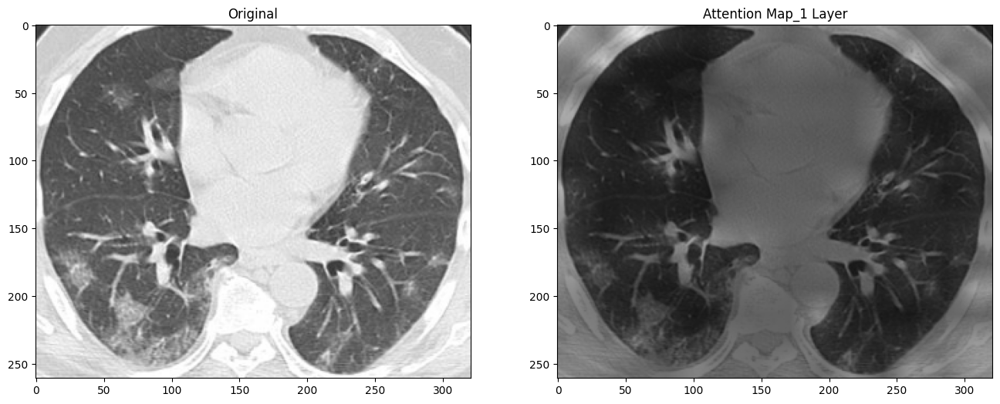

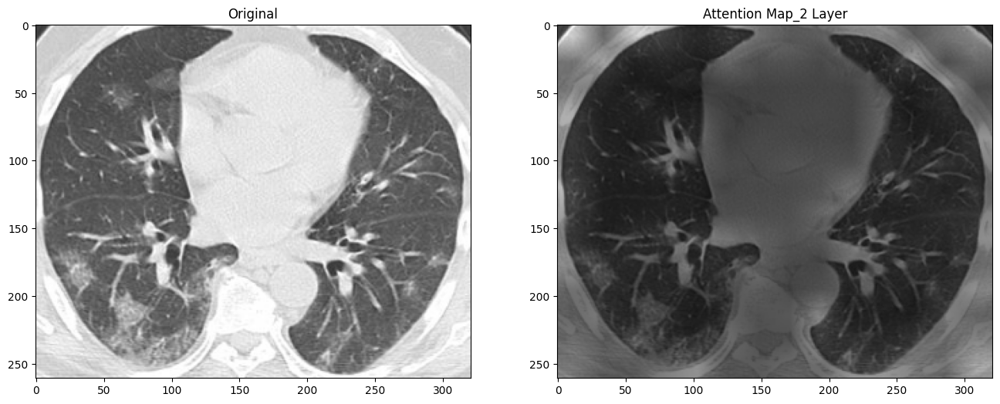

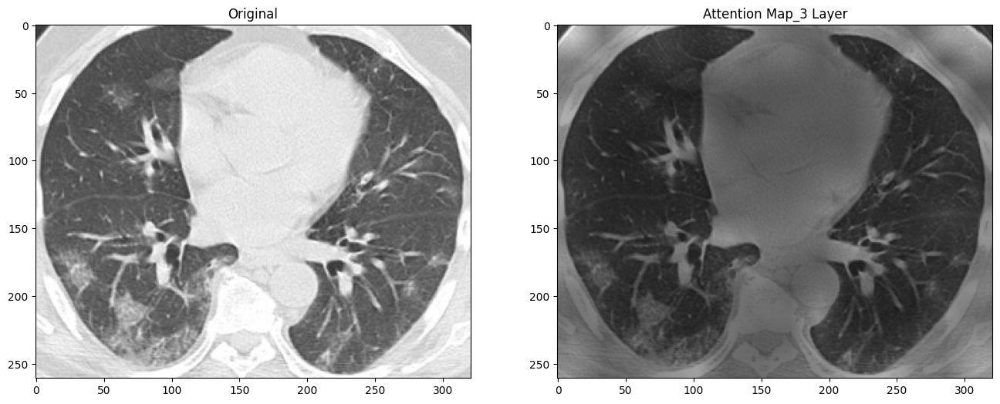

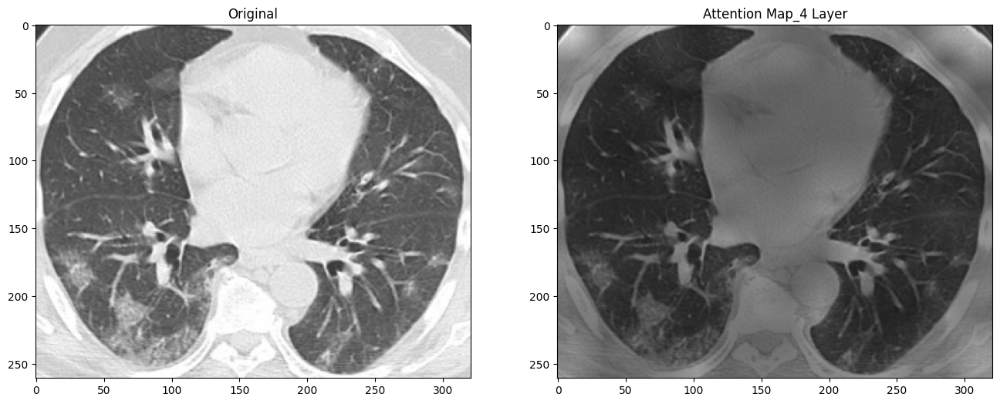

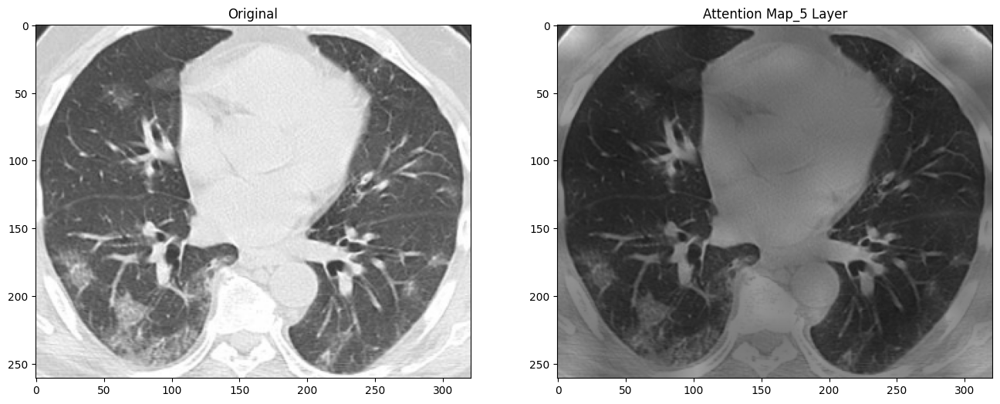

...

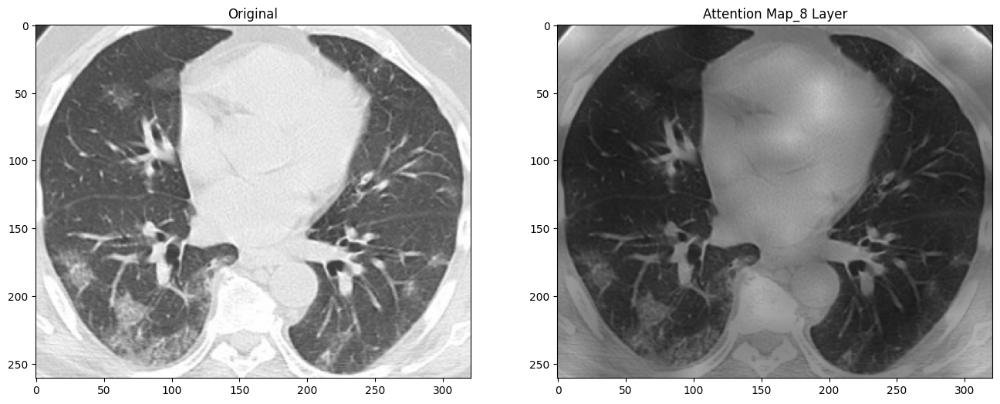

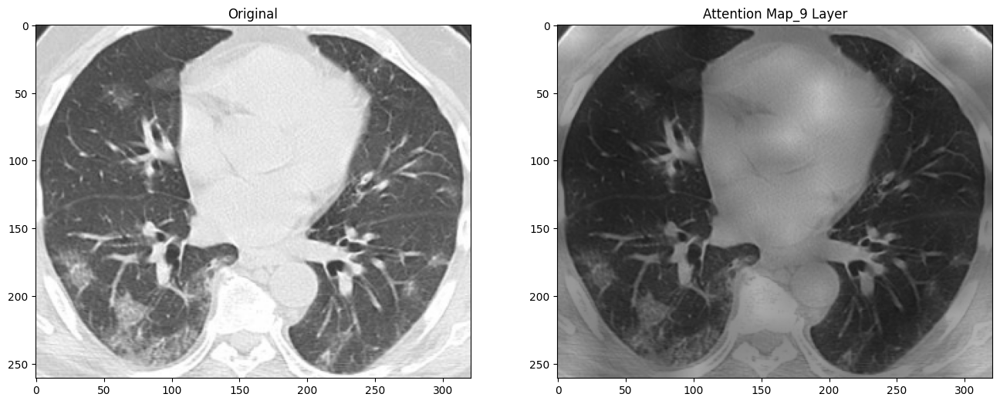

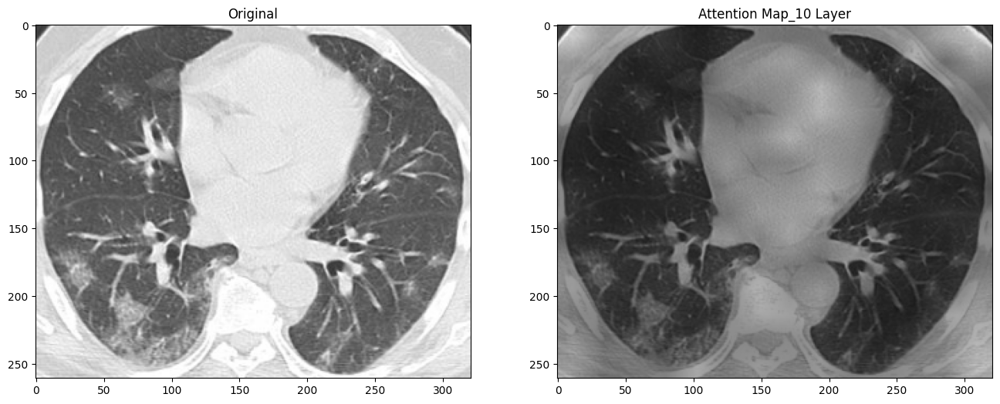

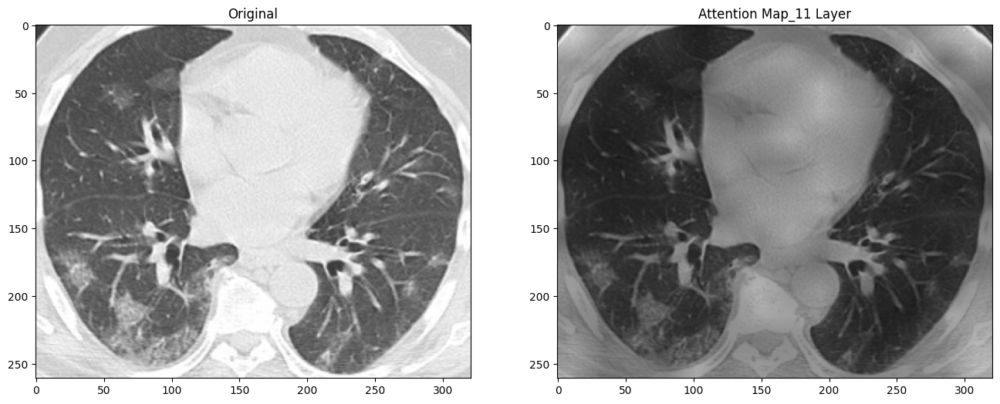

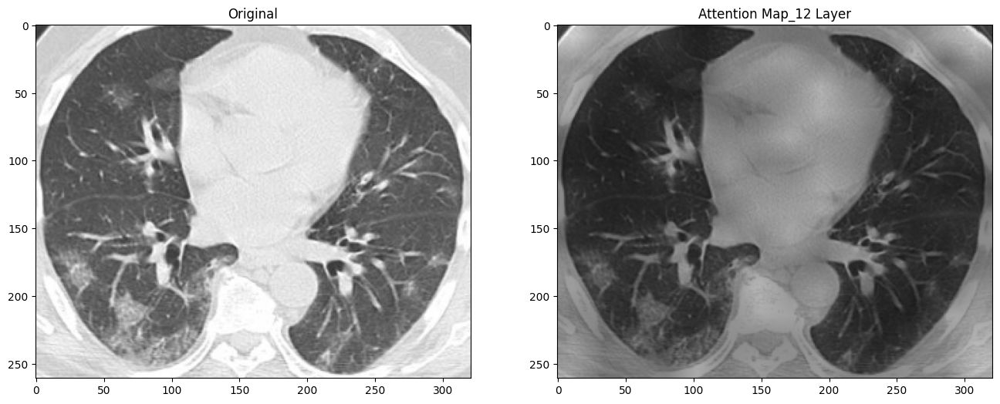

In [ ]:
for i, v in enumerate(joint_attentions):
    # Attention from the output token to the input space.
    mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
    mask = cv2.resize(mask / mask.max(), im.size)[..., np.newaxis]
    result = (mask * im).astype("uint8")

    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))
    ax1.set_title('Original')
    ax2.set_title('Attention Map_%d Layer' % (i+1))
    _ = ax1.imshow(im)
    _ = ax2.imshow(result)

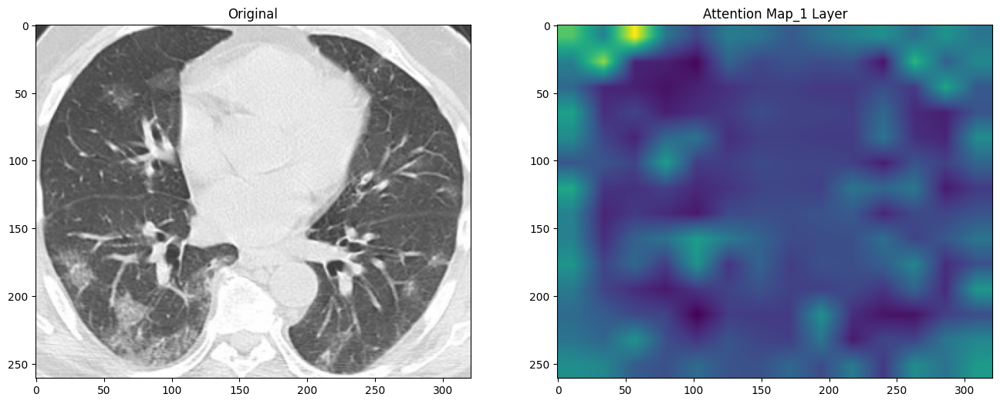

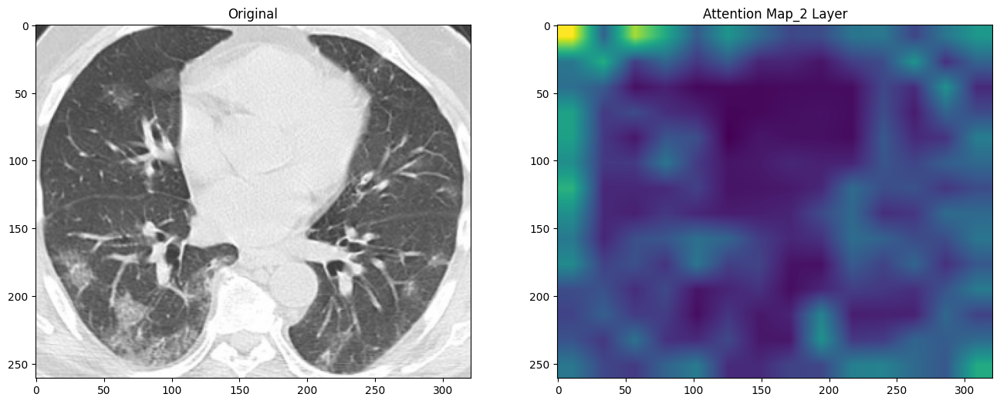

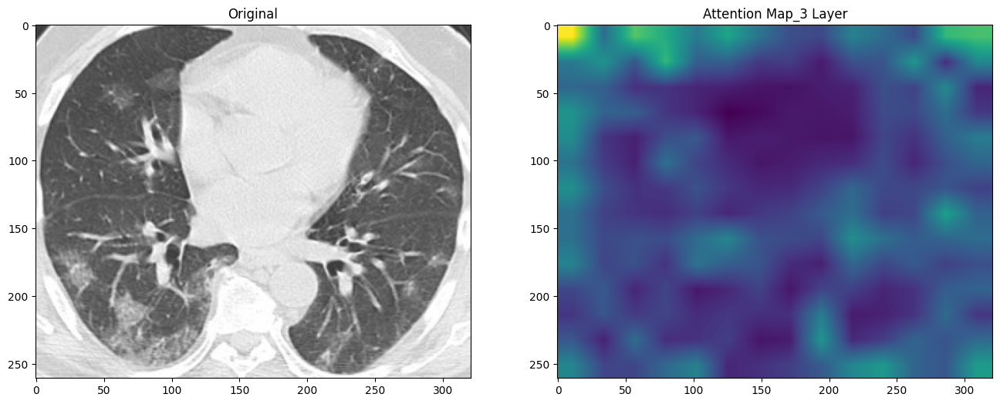

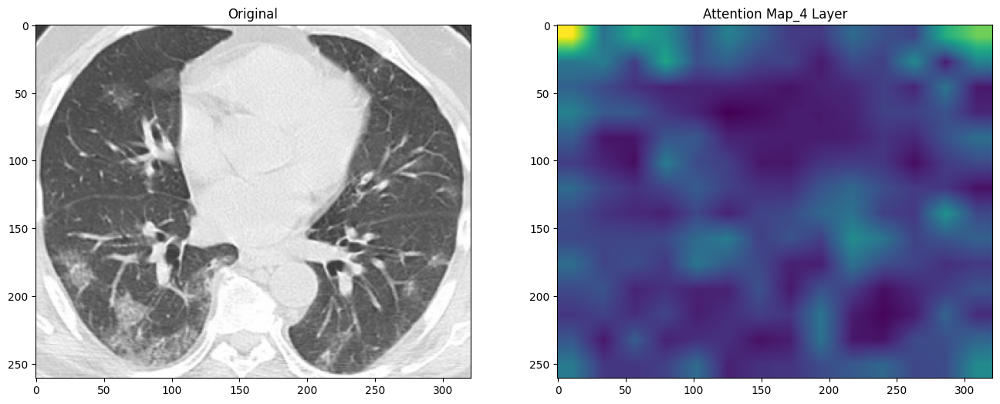

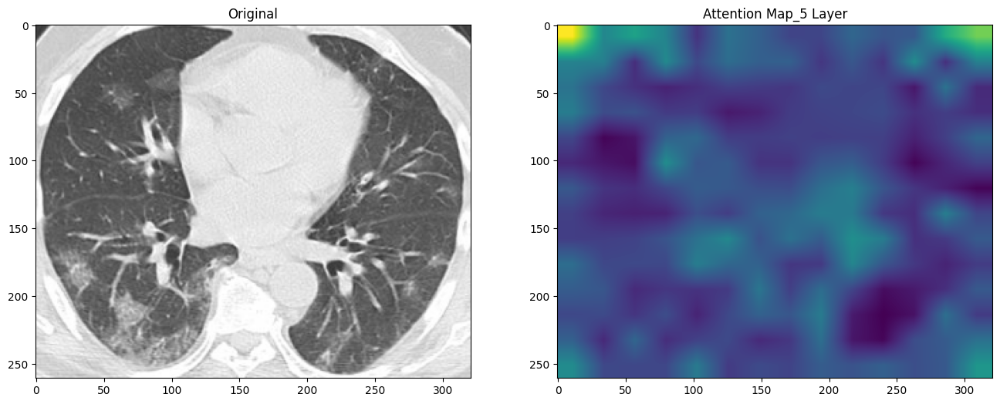

...

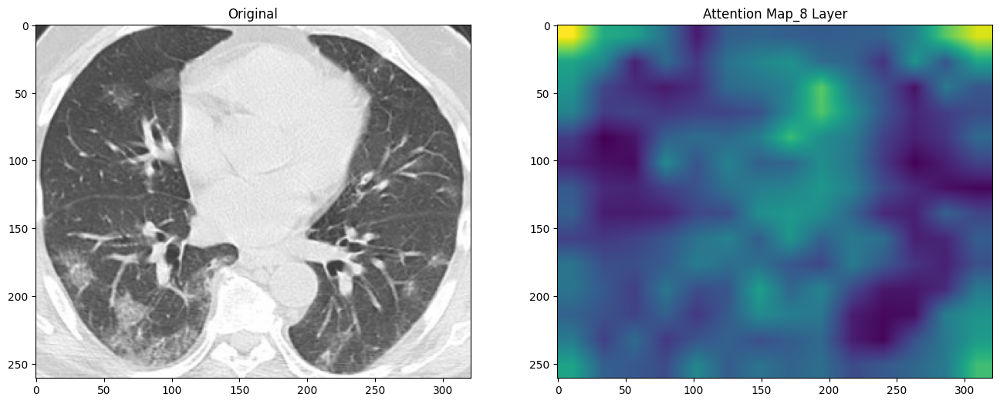

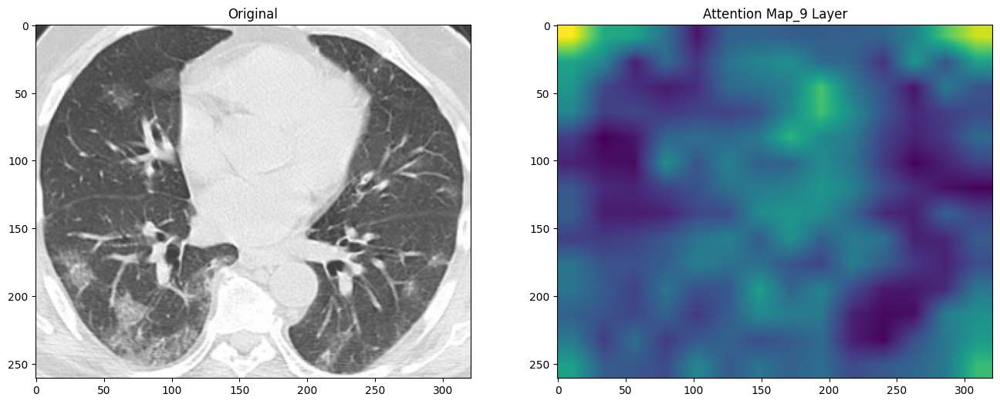

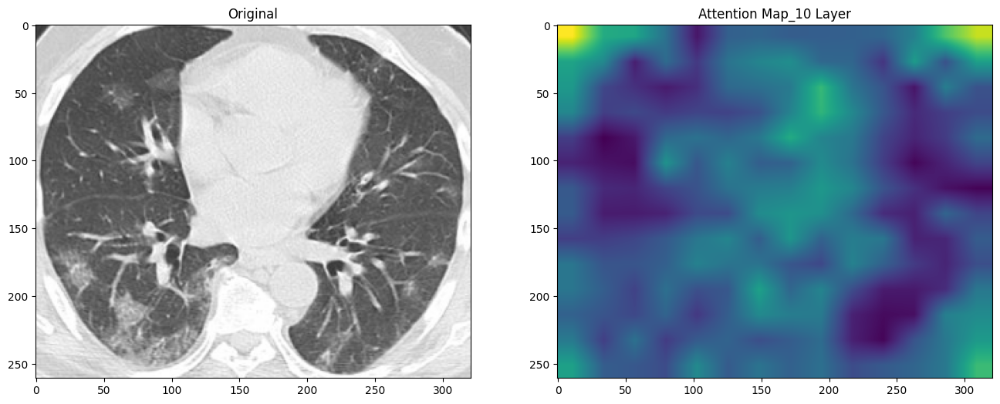

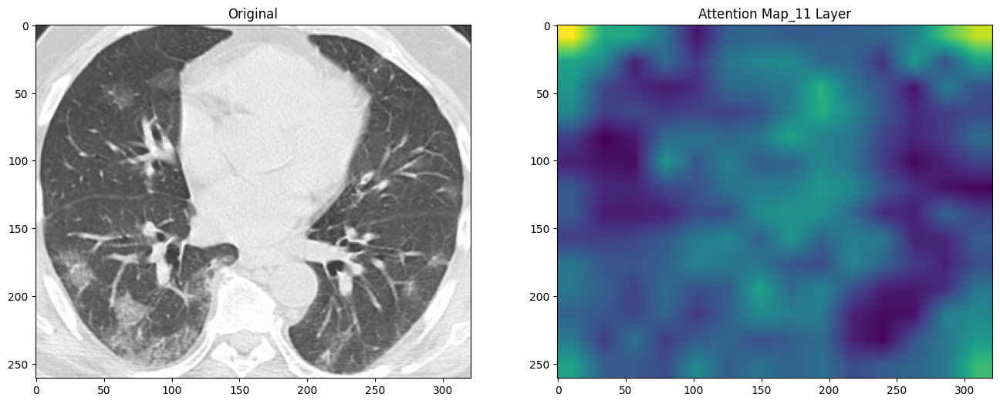

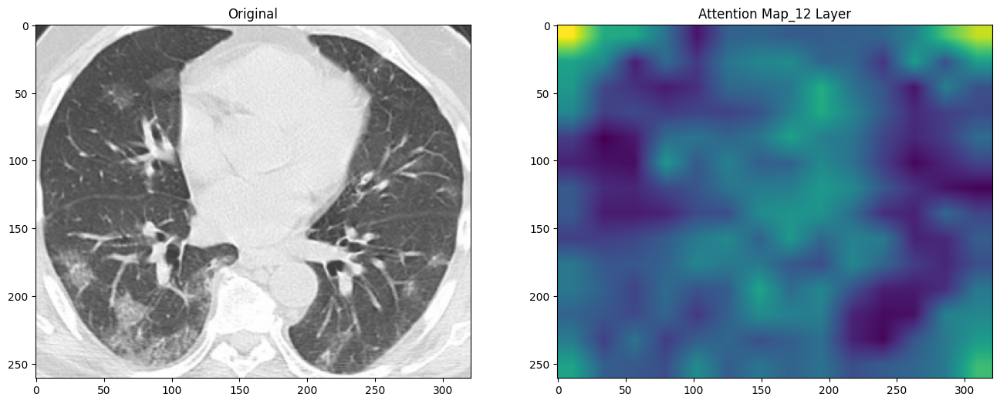

In [ ]:
for i, v in enumerate(joint_attentions):
    # Attention from the output token to the input space.
    mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
    mask = cv2.resize(mask / mask.max(), im.size)[..., np.newaxis]
    result = (mask * im).astype("uint8")

    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))
    ax1.set_title('Original')
    ax2.set_title('Attention Map_%d Layer' % (i+1))
    _ = ax1.imshow(im)
    _ = ax2.imshow(mask)

## Attention heatmaps

In [ ]:
# Attention from the output token to the input space.
v = joint_attentions[-1]
grid_size = int(np.sqrt(aug_att_mat.size(-1)))
mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
mask = cv2.resize(mask / mask.max(), im.size)[..., np.newaxis]
result = (mask * im).astype("uint8")

In [ ]:
v[0, 1:].reshape(grid_size, grid_size).shape

torch.Size([14, 14])

In [ ]:
result.shape

(261, 321, 3)

In [ ]:
im.size

(321, 261)

In [ ]:
type(mask)

numpy.ndarray

In [ ]:
v.shape

torch.Size([197, 197])

In [ ]:
mask = np.array(v[0, 1:].reshape(grid_size, grid_size))
mask = cv2.resize(mask / mask.max(), im.size)
img_attention = Image.fromarray((mask * 255).astype(np.uint8))

In [ ]:
im.size

(321, 261)

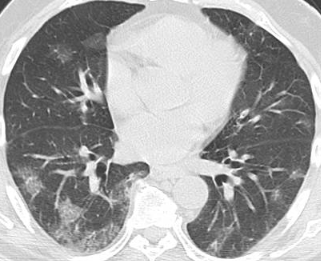

In [ ]:
im

In [ ]:
img_attention.size

(321, 261)

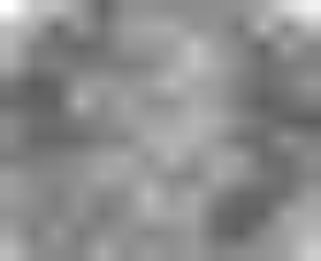

In [ ]:
img_attention

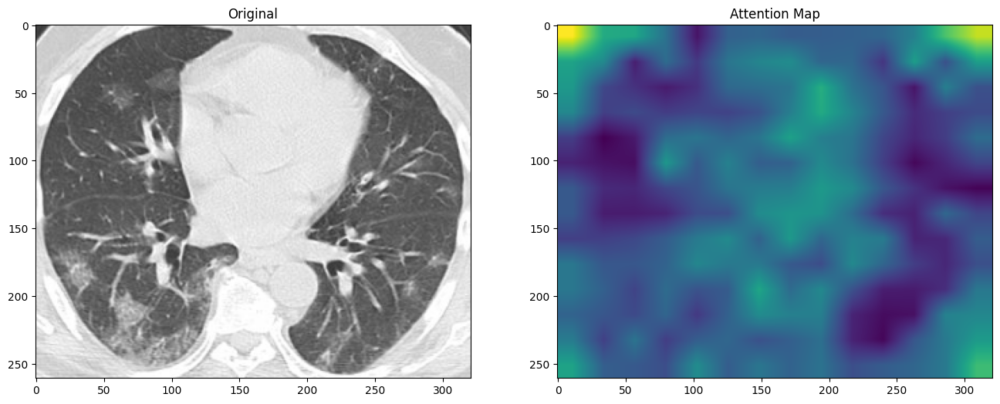

In [ ]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))

ax1.set_title('Original')
ax2.set_title('Attention Map')
_ = ax1.imshow(im)
_ = ax2.imshow(mask)